<h3>Data Science Project - COS10022 Introduction to Data Science - Swinburne University of Technology</h3>
<h3>Student Name: Minh Hoang Nguyen</h3>
<h3>Student ID: 1032 95032</h3>
<h4>Prediction Models: </h4>
<h5>+ Seasonal ARIMA</h5>
<h5>+ TensorFlow LSTM</h5>

# 0. Library and Upload Data

Click Restart Runtime after running the installation of PMARIMA

In [ ]:
!pip3 install pmdarima

     |████████████████████████████████| 1.5MB 21.1MB/s 
     |████████████████████████████████| 9.5MB 50.3MB/s 
     |████████████████████████████████| 2.1MB 47.2MB/s 
  Found existing installation: statsmodels 0.10.2
    Uninstalling statsmodels-0.10.2:
      Successfully uninstalled statsmodels-0.10.2
  Found existing installation: Cython 0.29.22
    Uninstalling Cython-0.29.22:
      Successfully uninstalled Cython-0.29.22


In [ ]:
from google.colab import files

In [ ]:
import pandas as pd
pd.set_option('display.max_columns', 500)

import numpy as np

import matplotlib.pyplot as plt
get_ipython().run_line_magic('matplotlib', 'inline')

import matplotlib.ticker as ticker

import seaborn as sns
sns.set_style('whitegrid')

from statsmodels.tsa.stattools import adfuller, acf, pacf
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf


from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot

from sklearn import metrics

from sklearn.linear_model import LinearRegression

import warnings

import datetime
from datetime import timedelta 
import statistics

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
uploaded = files.upload()

Saving dataset.csv to dataset.csv


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy.stats import pearsonr
%matplotlib inline

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import pandas as pd
import seaborn as sns
from pylab import rcParams
import matplotlib.pyplot as plt
from matplotlib import rc
%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style='whitegrid', palette='muted', font_scale=1.5)
rcParams['figure.figsize'] = 16, 10

In [ ]:
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler
                                                            
from tensorflow.python.keras.preprocessing.sequence import TimeseriesGenerator  #must use this one for training with TimeSeriesGenerator 
import tensorflow as tf
import matplotlib.dates as mdates
from scipy.stats import pearsonr
%matplotlib inline

# 1. Data Exploration, Cleaning and Visualization

<h1>a. Data Exploration</h1>

First of all, we will upload and describe about the data of the parking Birmingham.

In [ ]:
parking_data = pd.read_csv('dataset.csv')
parking_data.describe()

,Capacity,Occupancy
count,35717.000000,35717.000000
mean,1397.550130,642.228911
std,1179.326833,656.955535
min,220.000000,-8.000000
25%,500.000000,210.000000
50%,849.000000,446.000000
75%,2009.000000,798.000000
max,4675.000000,4327.000000


In [ ]:
parking_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35717 entries, 0 to 35716
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   SystemCodeNumber  35717 non-null  object
 1   Capacity          35717 non-null  int64 
 2   Occupancy         35717 non-null  int64 
 3   LastUpdated       35717 non-null  object
dtypes: int64(2), object(2)
memory usage: 1.1+ MB


<h1>b. Data Cleaning</h1>

I have checked the number of null values, so that we can clearly understand our data and know whether or not the data contained the null value to fix and clean.

In [ ]:
parking_data.isnull().sum()

SystemCodeNumber    0
Capacity            0
Occupancy           0
LastUpdated         0
dtype: int64

Next step, I will change type of some metadata, and separate the LastUpdated columns to date and time columns for better comparison between time series of data. Moreover, I created a new column to clearly choose the period time of each time step. It will be the time_halfhour column which the time is from 8 A.M to 6:30 P.M with 18 times steps per day, each interval of time is 30 minutes apart. By making this column, I can easily clean and prepare the dataset for training model at Step 3

In [ ]:
parking_data_clean = parking_data.copy()
parking_data_clean.LastUpdated = parking_data_clean.LastUpdated.astype('datetime64')
parking_data_clean['OccupancyRate'] = parking_data_clean.Occupancy / parking_data_clean.Capacity
parking_data_clean['Date'] = parking_data_clean.LastUpdated.dt.date
parking_data_clean['Time'] = parking_data_clean.LastUpdated.dt.time
parking_data_clean['datetime_halfhour'] = parking_data_clean.LastUpdated.dt.round('30min')
parking_data_clean['time_halfhour'] = parking_data_clean.datetime_halfhour.dt.time
dayname = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
parking_data_clean['DayOfWeek'] = pd.to_datetime(parking_data_clean['Date']).dt.dayofweek.apply(lambda x: dayname[x])
parking_data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35717 entries, 0 to 35716
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   SystemCodeNumber   35717 non-null  object        
 1   Capacity           35717 non-null  int64         
 2   Occupancy          35717 non-null  int64         
 3   LastUpdated        35717 non-null  datetime64[ns]
 4   OccupancyRate      35717 non-null  float64       
 5   Date               35717 non-null  object        
 6   Time               35717 non-null  object        
 7   datetime_halfhour  35717 non-null  datetime64[ns]
 8   time_halfhour      35717 non-null  object        
 9   DayOfWeek          35717 non-null  object        
dtypes: datetime64[ns](2), float64(1), int64(2), object(5)
memory usage: 2.7+ MB


In [ ]:
parking_data_clean.head()

,SystemCodeNumber,Capacity,Occupancy,LastUpdated,OccupancyRate,Date,Time,datetime_halfhour,time_halfhour,DayOfWeek
0,BHMBCCMKT01,577,61,2016-10-04 07:59:42,0.105719,2016-10-04,07:59:42,2016-10-04 08:00:00,08:00:00,Tuesday
1,BHMBCCMKT01,577,64,2016-10-04 08:25:42,0.110919,2016-10-04,08:25:42,2016-10-04 08:30:00,08:30:00,Tuesday
2,BHMBCCMKT01,577,80,2016-10-04 08:59:42,0.138648,2016-10-04,08:59:42,2016-10-04 09:00:00,09:00:00,Tuesday
3,BHMBCCMKT01,577,107,2016-10-04 09:32:46,0.185442,2016-10-04,09:32:46,2016-10-04 09:30:00,09:30:00,Tuesday
4,BHMBCCMKT01,577,150,2016-10-04 09:59:48,0.259965,2016-10-04,09:59:48,2016-10-04 10:00:00,10:00:00,Tuesday


I will use the groupby() and size() functions to check the time_halfhour column which I have described above. 
Because we have 18 timesteps per day and from 8:00 to 16:30, so that I will remove the 30 recorded values at 7:30 A.M.


In [ ]:
parking_data_clean.groupby('time_halfhour').size()

time_halfhour
07:30:00      30
08:00:00    2096
08:30:00    1971
09:00:00    1953
09:30:00    1983
10:00:00    1987
10:30:00    1985
11:00:00    1961
11:30:00    1988
12:00:00    1976
12:30:00    1982
13:00:00    1988
13:30:00    1958
14:00:00    1984
14:30:00    1989
15:00:00    1986
15:30:00    1985
16:00:00    1956
16:30:00    1959
dtype: int64

In [ ]:
parking_data_clean = parking_data_clean[parking_data_clean.time_halfhour > datetime.time(7,30)]

In [ ]:
parking_data_clean.groupby('time_halfhour').size()

time_halfhour
08:00:00    2096
08:30:00    1971
09:00:00    1953
09:30:00    1983
10:00:00    1987
10:30:00    1985
11:00:00    1961
11:30:00    1988
12:00:00    1976
12:30:00    1982
13:00:00    1988
13:30:00    1958
14:00:00    1984
14:30:00    1989
15:00:00    1986
15:30:00    1985
16:00:00    1956
16:30:00    1959
dtype: int64

To make sure that our dataset doesn’t have any duplicated values, Next step I will drop those values.

In [ ]:
parking_data_clean = parking_data_clean.drop_duplicates()

We didn’t know whether or not our dataset contained inconsistent data such as the occupancy below 0, or the occupancy is above the threshold of capacity. So that we will check it and remove those inconsistent data.

In [ ]:
print('Before - Minimum Percentage Of Occupancy Rate: {} %'.format(parking_data_clean.OccupancyRate.min()*100))
print('Before - Maximum Percentage of Occupancy Rate: {} %'.format(parking_data_clean.OccupancyRate.max()*100))

Before - Minimum Percentage Of Occupancy Rate: -1.6666666666666667 %
Before - Maximum Percentage of Occupancy Rate: 104.1343669250646 %


In [ ]:
parking_data_clean = parking_data_clean[parking_data_clean['Occupancy']>=0 ]
parking_data_clean = parking_data_clean[parking_data_clean['Capacity']>=0 ]
false_data = parking_data_clean[parking_data_clean['Occupancy']> parking_data_clean['Capacity']]
parking_data_clean = pd.concat([parking_data_clean, false_data]).drop_duplicates(keep=False)

In [ ]:
print('After - Minimum Percentage Of Occupancy Rate: {} %'.format(parking_data_clean.OccupancyRate.min()*100))
print('After - Maximum Percentage of Occupancy Rate: {} %'.format(parking_data_clean.OccupancyRate.max()*100))

After - Minimum Percentage Of Occupancy Rate: 0.0 %
After - Maximum Percentage of Occupancy Rate: 100.0 %


<h1>c. Data Visualization</h1>

I used the nunique() function to make sure that it only had 30 car parks based on the number of SystemCodeNumber which described the name of each carpark. Moreover, I can check the number of unique capacities, if it presents the number 30, so that this data set contained the data of 30 carparks and each car park has their specific capacity. 

In [ ]:
parking_data_clean.nunique()

SystemCodeNumber        30
Capacity                30
Occupancy             3008
LastUpdated           1765
OccupancyRate        14250
Date                    73
Time                  1696
datetime_halfhour     1309
time_halfhour           18
DayOfWeek                7
dtype: int64

I will make some statistical analysis from this dataset such as mean and median value, and I will use the function std() to calculate the standard deviation for the metadata “Occupancy”

In [ ]:
print (np.mean(parking_data_clean['Occupancy'])) # mean
print (statistics.median(parking_data_clean['Occupancy'])) # median
print (parking_data_clean['Occupancy'].var())
print (np.std(parking_data_clean['Occupancy'], ddof=1) / np.sqrt(len(parking_data_clean['Occupancy'])))

645.6873628722041
450
436369.1510157152
3.5261793433176263


In [ ]:
np.std(parking_data_clean['Occupancy'], ddof=1) # Standard deviation - Occupancy

660.5824331722084

Next, I will calculate the mean of occupancy per day of 30 carparks on scatter chart and line graph

In [ ]:
mean_all = parking_data_clean.groupby('Time').mean()
print(mean_all)

             Capacity   Occupancy  OccupancyRate
Time                                            
07:45:20  1010.000000   42.000000       0.041584
07:45:37   485.000000  212.000000       0.437113
07:46:01   450.000000   13.000000       0.028889
07:46:28   450.000000   76.000000       0.168889
07:46:35   450.000000   13.000000       0.028889
...               ...         ...            ...
16:34:02  1392.142857  619.285714       0.485788
16:34:06  1427.037037  647.407407       0.502097
16:34:08  1392.142857  553.535714       0.431370
16:34:18  1392.142857  550.750000       0.430024
16:34:28  1456.923077  746.961538       0.529222

[1696 rows x 3 columns]


By comparing the occupancy and occupancy rate at each specific time during a day from 2 chart above, we can clearly see the trend of high occupancy between 11:00 A.M and 3:00 P.M of all 30 carparks. 

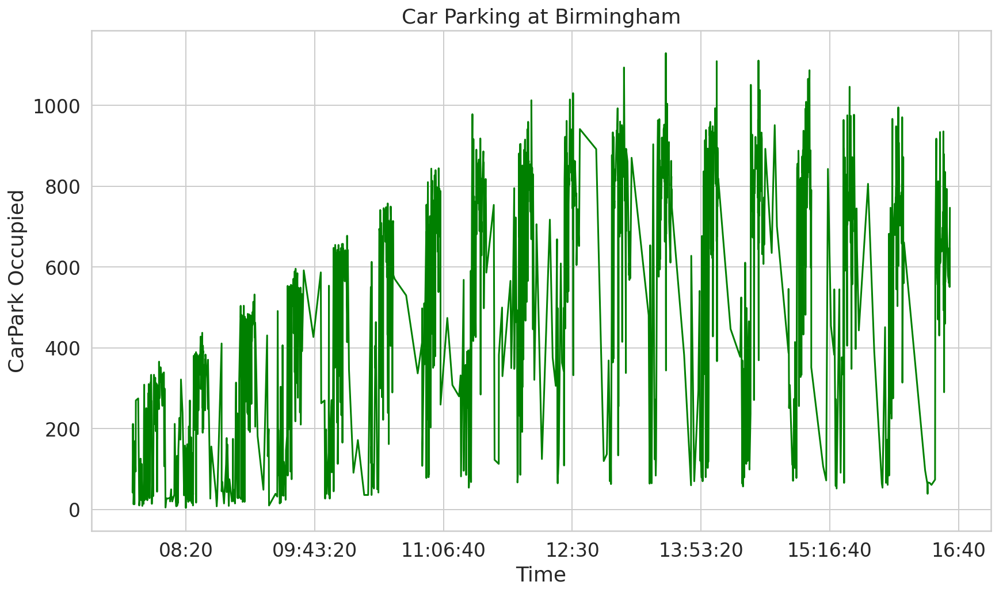

In [ ]:
# CarPark Occupied - Day Time
plt.figure(figsize=(14,8))
mean_all['Occupancy'].plot(color='green')
plt.ylabel('CarPark Occupied')
plt.title('Car Parking at Birmingham')
plt.show()

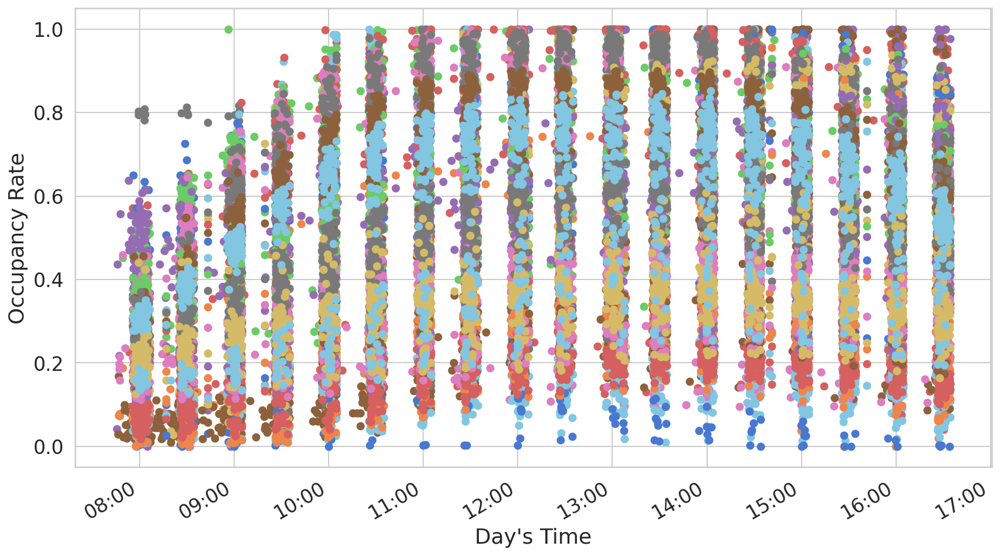

In [ ]:
# Occupancy Rate - Day Time - 30 Carparks
plt.figure(figsize=(14,8))
plt.plot([],[])
park_name = parking_data_clean['SystemCodeNumber'].unique()
for i in range(len(park_name)):
    s = park_name[i]
    rate = parking_data_clean[parking_data_clean['SystemCodeNumber'] == s]['OccupancyRate']
    time=pd.to_datetime(parking_data_clean[parking_data_clean['SystemCodeNumber'] == s]['Time'],
                        format='%H:%M:%S')
    plt.scatter(time,rate,label=s)
plt.gcf().autofmt_xdate()
myFmt = mdates.DateFormatter('%H:%M')
plt.gca().xaxis.set_major_formatter(myFmt)    
plt.xlabel("Day's Time")
plt.ylabel('Occupancy Rate')
plt.show()
plt.close()

Moreover, by using the DayOfWeek column with the mean of occupancy rate, we find out that the occupancy rate of weekday is significantly higher than the occupancy rate of weekend. The graph below indicates that the occupancy rate went top at Thursday and is lower on weekend and lowest at Sunday. Therefore, the users often park their car during weekday and rarely use the carpark on weekend.

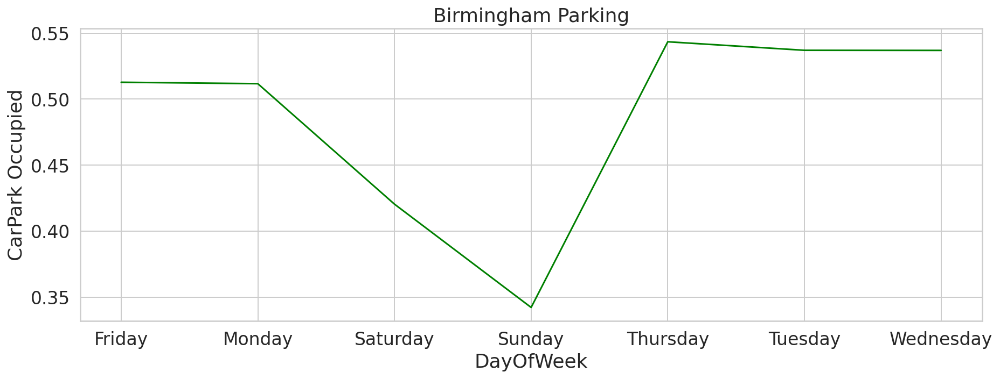

              Capacity   Occupancy  OccupancyRate
DayOfWeek                                        
Friday     1395.371559  667.488305       0.512771
Monday     1406.512364  665.970401       0.511686
Saturday   1449.477407  600.934076       0.420440
Sunday     1424.812405  494.672688       0.342189
Thursday   1397.287974  699.320827       0.543434
Tuesday    1395.323470  680.474570       0.536982
Wednesday  1396.595713  688.698263       0.536895


In [ ]:
plt.figure(figsize=(15,5))
dowmean = parking_data_clean.groupby('DayOfWeek').mean()
dowmean['OccupancyRate'].plot(color='green')
plt.ylabel('CarPark Occupied')
plt.title('Birmingham Parking')
plt.show()
print(dowmean)

Not only visualize to see the trend of using carpark during week, but also visualize to see and check the trend from a month span. As the graph below, we can clearly see that it has the increase of average occupancy in the future. Moreover, you can also see that it has some spike in capacity number, it could be the fault data in dataset, so we would clean and prepare the dataset again before put it into the model to train.

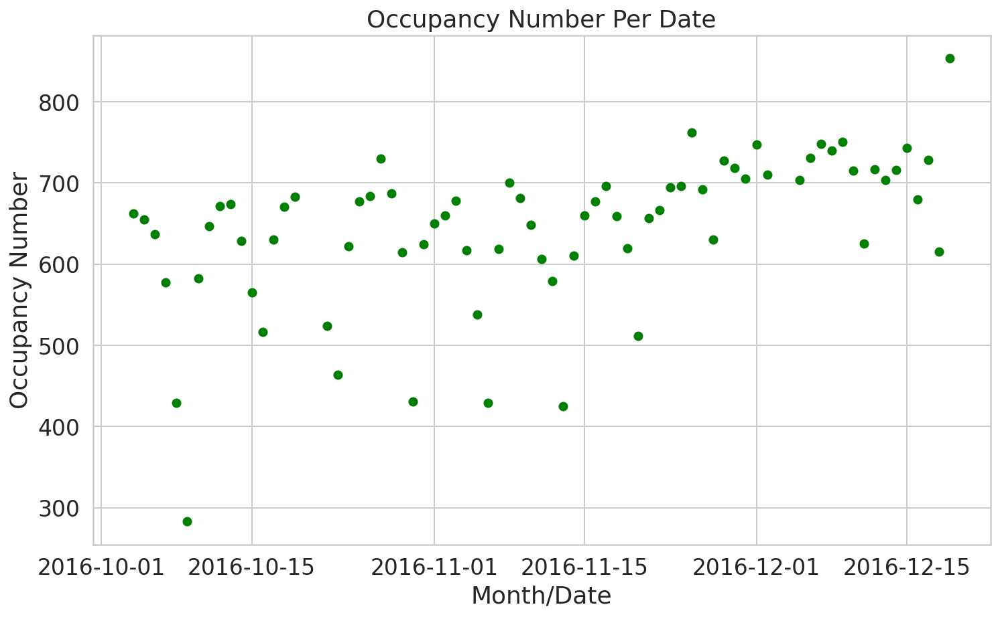

In [ ]:
plt.figure(figsize=(12,7))
parking_data_clean['Date'] = parking_data_clean.LastUpdated.dt.date
date_x = parking_data_clean.groupby('Date').mean()
plt.scatter(date_x.index, date_x['Occupancy'], color = 'green')
plt.ylabel('Occupancy Number')
plt.xlabel('Month/Date')
plt.title('Occupancy Number Per Date')
plt.show()

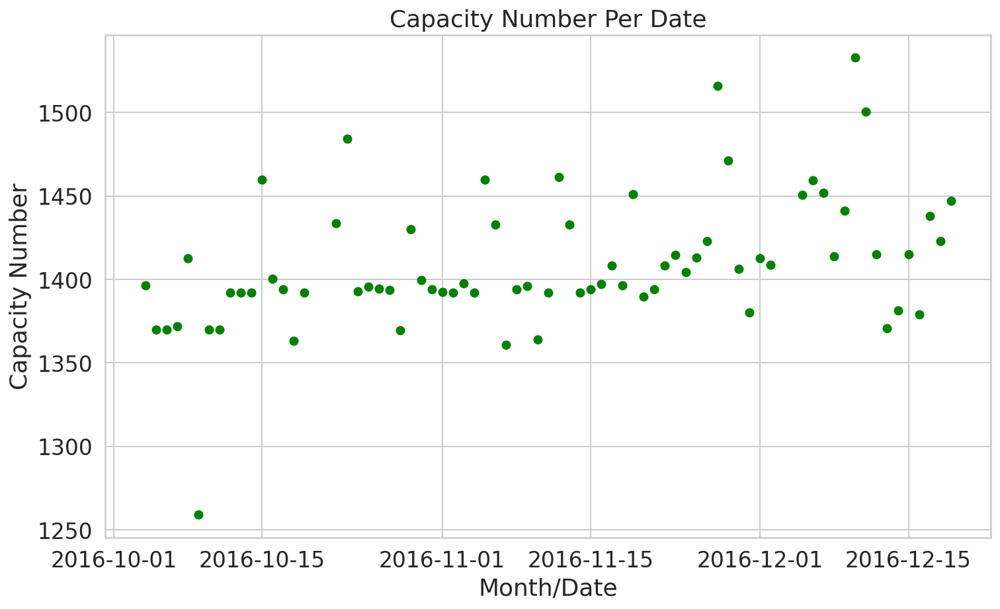

In [ ]:
plt.figure(figsize=(12,7))
parking_data_clean['Date'] = parking_data_clean.LastUpdated.dt.date
x_date = parking_data_clean.groupby('Date').mean()
plt.scatter(x_date.index, x_date['Capacity'], color = 'green')
plt.ylabel('Capacity Number')
plt.xlabel('Month/Date')
plt.title('Capacity Number Per Date')
plt.show()

The mean occupancy rate is indicated at the bar graph below. As you can see from the bar graph that we have some location with the very high of mean occupancy rate. But it doesn’t mean that we will suggest the company to extend the capacity of those carpark. I will visualize and analyze 30 carparks to check which one should be dropped by the reasons such as not enough data is collected.

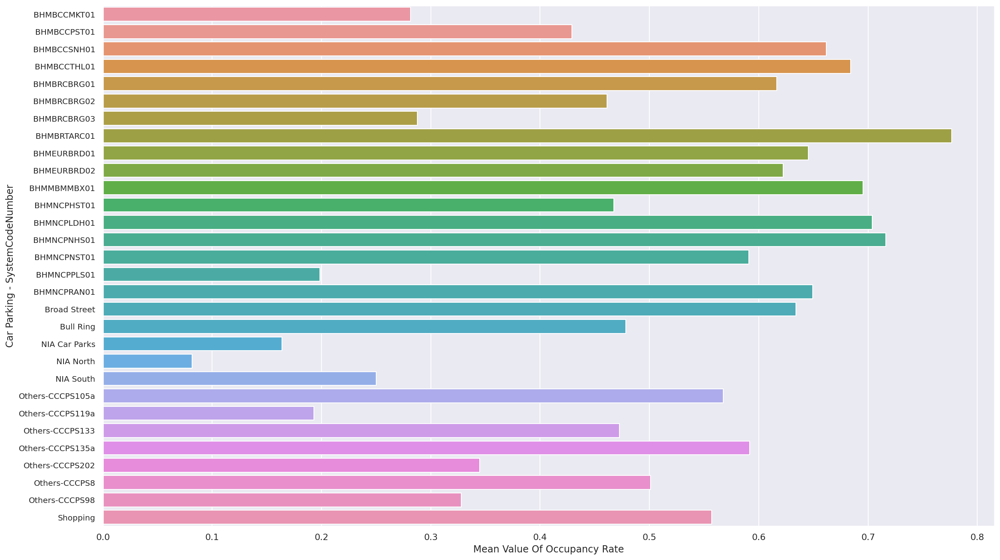

In [ ]:
sns.set(rc={'figure.figsize':(20,12)})
visual_Data = parking_data_clean.groupby('SystemCodeNumber')['OccupancyRate'].mean()
key = list(visual_Data.keys()) 
val = []
for x in key:
    val.append(visual_Data[x])
df = pd.DataFrame(list(zip(key, val)), 
               columns =['Parking - SystemCodeNumber', 'Mean Value Of Occupancy Rate']) 
ax = sns.barplot(y='Parking - SystemCodeNumber',x='Mean Value Of Occupancy Rate',data=df,orient="h")
ax.set(ylabel="Car Parking - SystemCodeNumber", xlabel = "Mean Value Of Occupancy Rate")
ax.tick_params(axis='y', labelsize=10)

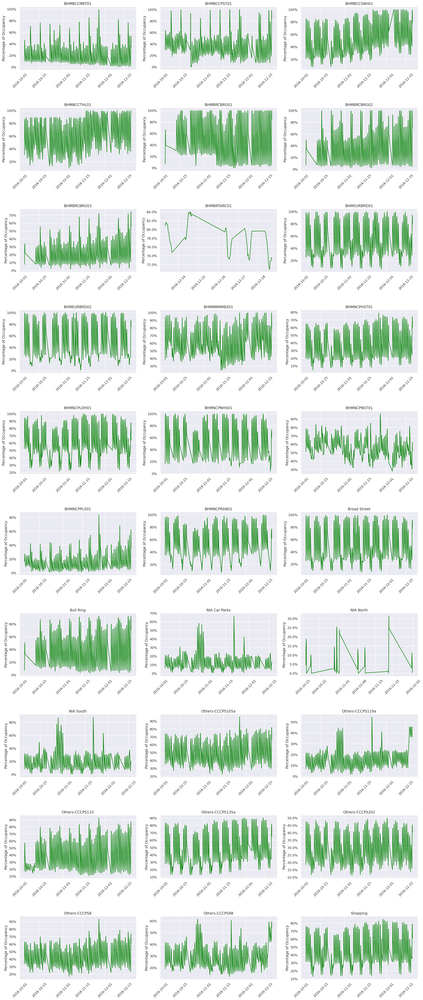

In [ ]:
def plots_by_code(input, number_of_graphs, number_of_row, width=24, hspace=0.6):
    number_of_rows = int(np.ceil(number_of_graphs/number_of_row))
    fig, axes = plt.subplots(nrows=number_of_rows, ncols=number_of_row, figsize=(width, number_of_rows * width/4))
    fig.subplots_adjust(hspace=hspace)
    plt.xticks(rotation=45)
    for h, code in enumerate(input.SystemCodeNumber.unique()[:number_of_graphs]):
        temp_df = input[input.SystemCodeNumber==code]
        axs = axes[h//number_of_row, h%number_of_row]
        axs.plot(temp_df.LastUpdated, temp_df.OccupancyRate, color='green')
        axs.set_title('{}'.format(code))
        axs.set_ylabel('Percentage of Occupancy')
        axs.set_xlabel("\n")
        axs.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1));
        
    for axs in fig.axes:
        plt.sca(axs)
        plt.xticks(rotation=45)


plots_by_code(input=parking_data_clean, number_of_graphs=30, number_of_row=3)

As you can see from 30 graph of 30 carparks above, “BHMBRTARC01” and “NIA North” location weren’t enough data to build and train the model. So that we will exclude those 2 locations and use the heatmap which I will demonstrate below to see which of the remaining 28 locations will be used to build and train model.
The heatmap below help us in the way to recognize which parking lots were overloaded many times compared to each other, although those parking locations weren’t the location that having highest mean occupancy rate.


[Text(192.5, 0.5, 'CarPark Code'), Text(0.5, 66.5, 'Date')]

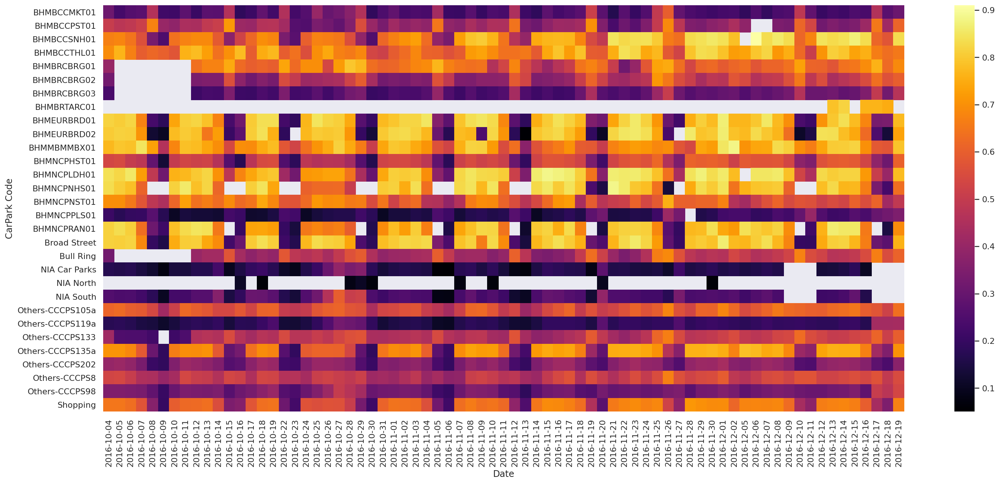

In [ ]:
sns.set(rc={'figure.figsize':(24,10)})
heatmap_data = pd.pivot_table(parking_data_clean, values='OccupancyRate', 
                     index=['SystemCodeNumber'], 
                     columns='Date')
ax = sns.heatmap(heatmap_data , cmap="inferno")
ax.set(ylabel="CarPark Code", xlabel = "Date")

As you can see from the heatmap above, the occupancy rate of 2 location “BHMEURBRD01” and “Broad Street” are quite similar. And it follows the trend of this dataset which I have described above that the occupancy rate of weekday is higher compared to the occupancy rate on weekend, and the data of both those two locations are quite good and don’t contain any white block in the heatmap.

# Correlation and Train Model (Carpark 1 - BHMEURBRD01)

## Build And Train Model (Part 1)

Now I will clean and prepare in deep to make those being able to use for the model.

In [ ]:
carpark1_parking_data_clean = parking_data_clean[parking_data_clean['SystemCodeNumber'].str.match('BHMEURBRD01')]

In [ ]:
data_drop = carpark1_parking_data_clean.groupby('datetime_halfhour').agg({'Occupancy':['sum','count'], 'Capacity':['sum','count']})
data_drop['OccupancyRate'] = data_drop.Occupancy['sum'] / data_drop.Capacity['sum']

At first, I will separate the dataset of the “BHMEURBRD01” to a specific variable. And I will make the sum and count column of Occupancy and Capacity to check whether or not this dataset contains the fault values that the count of both Occupancy or Capacity is higher than 1, and the sum of Capacity is below 470. If this “BHMEURBRD01” dataset contains any of the data that satisfying the conditions above, we need to clean this dataset again to remove those data.

In [ ]:
data_drop_check = data_drop[((data_drop.Occupancy['count']>1)|(data_drop.Capacity['count']>1))&(data_drop.Capacity['sum']<=470)]

In [ ]:
data_drop_check

Empty DataFrame
Columns: [(Occupancy, sum), (Occupancy, count), (Capacity, sum), (Capacity, count), (OccupancyRate, )]
Index: []

Next step is that we need to make sure each day would have 18 timesteps (from 8:00 to 16:30), so that we will run some code to check the datetime_halfhour column to find out which days and periods time weren’t included.

In [ ]:
data_drop.drop(columns=['Occupancy', 'Capacity'], inplace=True)

In [ ]:
temporary_df = data_drop.reset_index()
temporary_df['date'] = temporary_df.datetime_halfhour.dt.date
temporary_df['time'] = temporary_df.datetime_halfhour.dt.time
temporary_df = temporary_df.groupby('date').count()
temporary_df = pd.DataFrame(temporary_df, index=pd.date_range('2016-10-04', '2016-12-19')).fillna(0)
temporary_df[(temporary_df.datetime_halfhour == 0)|(temporary_df.datetime_halfhour < 18)]

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,datetime_halfhour,OccupancyRate,time
,,,
2016-10-20,0.0,0.0,0.0
2016-10-21,0.0,0.0,0.0
2016-10-28,17.0,17.0,17.0
2016-10-30,16.0,16.0,16.0
2016-11-03,17.0,17.0,17.0
2016-11-18,17.0,17.0,17.0
2016-11-25,17.0,17.0,17.0
2016-12-03,0.0,0.0,0.0
2016-12-04,0.0,0.0,0.0


As we can see from the picture above that we have 12 days weren’t contain enough 18 timesteps. Based on the knowledge of seasonal and trend that people would tend to do things on a weekly basis. So that I will create some code to fill in the missing time with the occupancy at the same time at the one week earlier.

In [ ]:
def fillmissing_based_week_prior(parameter, data_fill, year, month, day, hour, minutes):
  data_fill.loc[pd.to_datetime(datetime.datetime(year, month, day, hour, minutes)), parameter] = \
      data_fill.loc[pd.to_datetime(datetime.datetime(year, month, day, hour, minutes) + timedelta(days=-7)), parameter].values[0]

data_fillmissing = data_drop.copy()

for hour in range(8, 17):
  for hourhalf in [0, 30]:
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 4, hour, hourhalf)
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 3, hour, hourhalf)
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 21, hour, hourhalf)
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 20, hour, hourhalf)

fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 28, 8, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 30, 16, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 30, 16, 30)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 11, 3, 16, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 11, 18, 9, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 11, 25, 8, 30)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 13, 13, 30)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 14, 11, 0)


data_fillmissing.sort_index(inplace=True)

We will check again and see whether or not those missing data are filled. The picture below indicates nothing contained in the table, which means that those missing data are filled.

In [ ]:
temporary_df_x = data_fillmissing.reset_index()
temporary_df_x['date'] = temporary_df_x.datetime_halfhour.dt.date
temporary_df_x['time'] = temporary_df_x.datetime_halfhour.dt.time
temporary_df_x = temporary_df_x.groupby('date').count()
temporary_df_x = pd.DataFrame(temporary_df_x, index=pd.date_range('2016-10-04', '2016-12-19')).fillna(0)
temporary_df_x[(temporary_df_x.datetime_halfhour == 0)|(temporary_df_x.datetime_halfhour < 18)]

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,datetime_halfhour,OccupancyRate,time
,,,


Before splitting the data to train and test file, I will plot the data again together with data that will be shifted 18 timesteps (to the yesterday), the goal of this plot is that we can check and make sure that it doesn’t contain any more gaps in the data. This picture below indicated that it doesn’t contain any more gaps in the data, now we can move to the next part – splitting train and test and train the model.

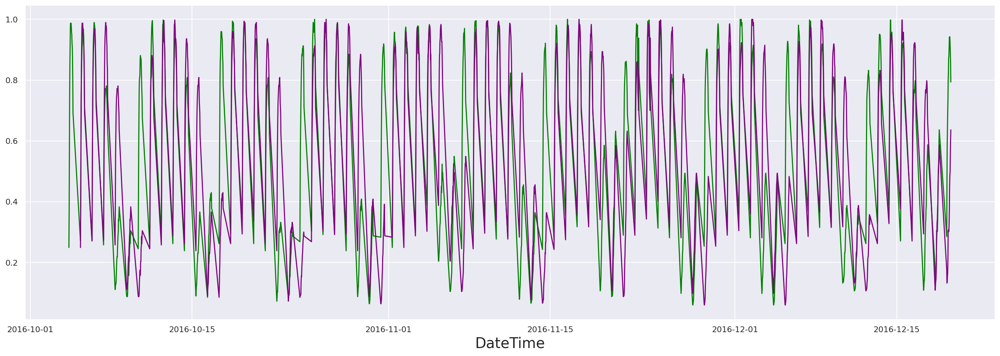

In [ ]:
plt.figure(figsize=(24,8))
plt.plot(data_fillmissing, color='green')
plt.plot(data_fillmissing.shift(18), color='purple')
plt.xlabel('DateTime', fontsize=20);

## Correlation (AutoCorrelation - Partial AutoCorrelation)

I will use Auto-Correlation and Partial Auto-Correlation with the goal that pointing out whether or not the data is seasonal properties based on the time it is collected.

### AutoCorrelation

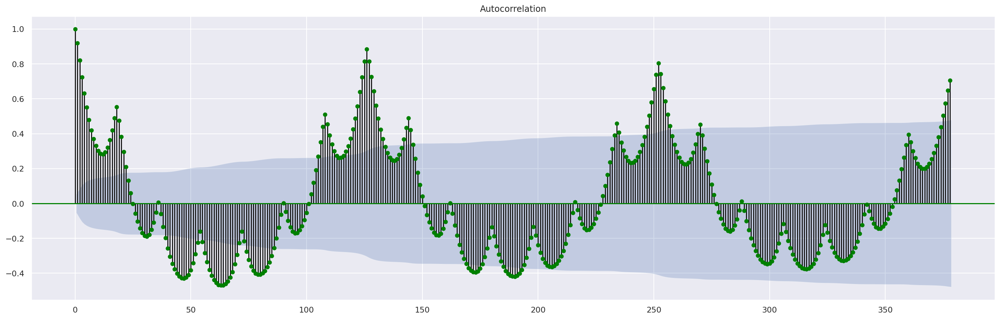

In [ ]:
def subplots_acf(series):
    fig1 = plt.figure(figsize=(24,16))
    ax1 = fig1.add_subplot(211)
    fig1 = plot_acf(series, lags=378, ax=ax1, color='green')
    plt.show()

subplots_acf(data_fillmissing)

###  Partial AutoCorrelation

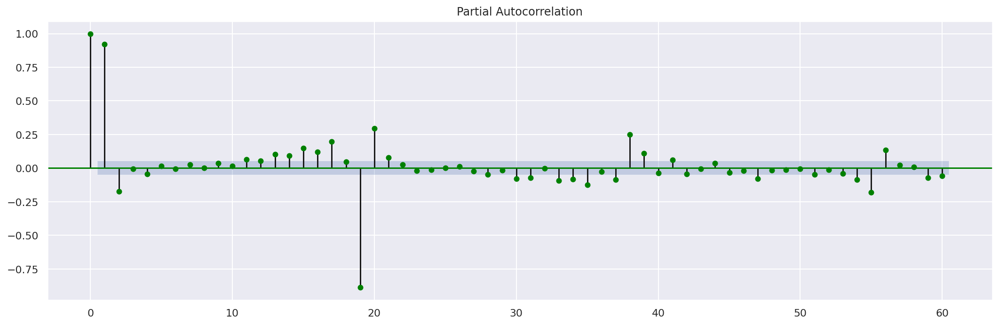

In [ ]:
def subplots_pacf(series):
    fig2 = plt.figure(figsize=(18,12))    
    ax2 = fig2.add_subplot(212)
    fig2 = plot_pacf(series, lags=60, ax=ax2, color='green')
    plt.show()

subplots_pacf(data_fillmissing)

From 2 figures from each of the carpark above that indicating the graphs of Auto-Correlation and Partial Auto-Correlation, we can clearly see the data contained both negative and positive correlation and its different between time. Because of that, the dataset of “BHMEURBRD01” are seasonal, and those reinforce the thesis of data discovery in the Part 1 that trend of the occupancy is higher on weekday compared to weekend and it changed during day time and between weekend and weekday.

##Build And Train Model (Part 2)

### Split data to train and Test

We will use the TimeSeriesSplit function of sklearn to split of data with the n_splits = 10, which means that we will use the first 10 weeks to train the model and test with the last week.

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=10)
print(tscv)

data_use = data_fillmissing.reset_index()['OccupancyRate']

for train_index, test_index in tscv.split(data_use):
  train = data_use[train_index]
  test = data_use[test_index]

TimeSeriesSplit(max_train_size=None, n_splits=10)


In [ ]:
print(train.describe())
print(test.describe())

count    1260.000000
mean        0.636108
std         0.295816
min         0.059574
25%         0.355319
50%         0.746809
75%         0.893617
max         1.000000
Name: OccupancyRate, dtype: float64
count    126.000000
mean       0.651368
std        0.262761
min        0.108511
25%        0.441489
50%        0.738298
75%        0.880319
max        0.997872
Name: OccupancyRate, dtype: float64


In [ ]:
train.index = data_fillmissing.index[:len(train)]
train.tail()

datetime_halfhour
2016-12-12 14:30:00    0.810638
2016-12-12 15:00:00    0.782979
2016-12-12 15:30:00    0.755319
2016-12-12 16:00:00    0.714894
2016-12-12 16:30:00    0.657447
Name: OccupancyRate, dtype: float64

In [ ]:
test.index = data_fillmissing.index[len(train):]
test.head()

datetime_halfhour
2016-12-13 08:00:00    0.327660
2016-12-13 08:30:00    0.440426
2016-12-13 09:00:00    0.623404
2016-12-13 09:30:00    0.717021
2016-12-13 10:00:00    0.791489
Name: OccupancyRate, dtype: float64

### SARIMA Model

We will import the auto_arima from pdarima to check the best ARIMA order

In [ ]:
from pmdarima import auto_arima
stepwise_fit = auto_arima(data_fillmissing['OccupancyRate'],
                          max_order = 4, stepwise = True, trace = True, suppress_warnings = True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-2107.940, Time=2.51 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=532.593, Time=0.22 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-2071.352, Time=0.21 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-773.221, Time=0.46 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2952.620, Time=0.08 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-2110.041, Time=1.91 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=-1367.881, Time=1.18 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-2111.355, Time=0.79 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-2111.038, Time=1.27 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-2112.814, Time=0.26 sec
 ARIMA(3,0,0)(0,0,0)[0] intercept   : AIC=-2110.923, Time=0.85 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=-2108.900, Time=1.22 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=-2049.781, Time=0.21 sec

Best model:  ARIMA(2,0,0)(0,0,0)[0] intercept
Total fit time: 11.201 seconds


In [ ]:
stepwise_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1386
Model:               SARIMAX(2, 0, 0)   Log Likelihood                1060.407
Date:                Sat, 17 Apr 2021   AIC                          -2112.814
Time:                        00:40:13   BIC                          -2091.877
Sample:                             0   HQIC                         -2104.983
                               - 1386                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0594      0.013      4.463      0.000       0.033       0.085
ar.L1          1.0823      0.028     38.994      0.000       1.028       1.137
ar.L2         -0.1757      0.024     -7.335      0.000      -0.223      -0.129
sigma2         0.0127      0.000     31.214      0.000       0.012       0.013
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              6847.71
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               0.89   Skew:                            -2.66
Prob(H) (two-sided):                  0.23   Kurtosis:                        12.51
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Best Order is (2,0,0), so that I will input this order to the SARIMA model.

In [ ]:
%%time
# Define and fit SARIMA model
my_seasonal_order = (9, 0, 3, 18)
sarima_model = SARIMAX(train, order=(2, 0, 0), seasonal_order=my_seasonal_order)
results_SAR = sarima_model.fit(disp=-1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:219: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


CPU times: user 20min 9s, sys: 8min 51s, total: 29min 1s
Wall time: 14min 42s


After running 14min 42s, I successfully got the prediction and I will test the prediction with the test data of the last week. Before visualize and evaluate the model, I would create a function which acts as a metrics to evaluate our prediction.

In [ ]:
def report_metrics(y_true, y_pred):
    print("Explained Variance:\n\t", metrics.explained_variance_score(y_true, y_pred))
    print("MAE:\n\t", metrics.mean_absolute_error(y_true, y_pred))
    print("RMSE:\n\t", np.sqrt(metrics.mean_squared_error(y_true, y_pred)))

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:576: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


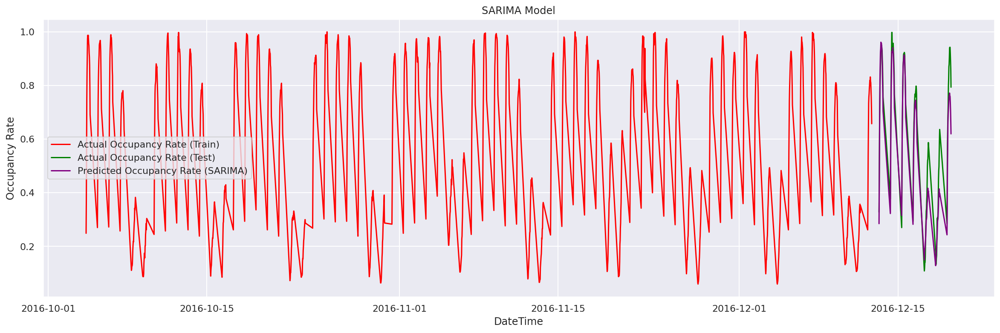

Explained Variance:
	 0.9453268420939106
MAE:
	 0.056020216455697915
RMSE:
	 0.07612719336354716


In [ ]:
plt.figure(figsize=(20,6))
plt.title('SARIMA Model')
plt.plot(train, color='red', label='Actual Occupancy Rate (Train)')
plt.xlabel('DateTime')
plt.ylabel('Occupancy Rate')
y_pred_sar = pd.Series(results_SAR.forecast(steps=len(test)).values, index=test.index)
plt.plot(test, color='green', label='Actual Occupancy Rate (Test)')
plt.plot(y_pred_sar, color='purple', label='Predicted Occupancy Rate (SARIMA)')
plt.legend()

plt.show()

report_metrics(test.squeeze(), y_pred_sar.squeeze())

The Output so that our model predicted with the accuracy 94.5326% compared to the real data test file. With the number of mean absolute error was about 0.056 and mean squared error was about 0.076, which evaluated that this model is quite good.

###TensorFlow - LSTM Model

First of all, I create an accordant train and test to train the TensorFlow LSTM model.

In [ ]:
scaler = MinMaxScaler()
scaler_data = scaler.fit_transform(data_fillmissing)
scaler_data = scaler_data[:,0]
time = np.arange(0, 1386, 1)

In [ ]:
scaler_df = pd.DataFrame(dict(OccupancyRate=scaler_data), index=time, columns=['OccupancyRate'])
train_size = int(len(scaler_df) * 0.8965)
test_size = len(scaler_df) - train_size
train2, test2 = scaler_df.iloc[0:train_size], scaler_df.iloc[train_size:len(scaler_df)]
print(len(train2), len(test2))

1242 144


In [ ]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

time_steps = 18
X_train, y_train = create_dataset(train2, train2.OccupancyRate, time_steps)
X_test, y_test = create_dataset(test2, test2.OccupancyRate, time_steps)
print(X_train.shape, y_train.shape)

(1224, 18, 1) (1224,)


After that, I prepare the LSTM model with the Keras and Mean Squared Error, and specify additional value.

In [ ]:
lstm_model = keras.Sequential()
lstm_model.add(keras.layers.LSTM(
  units=128,
  input_shape=(X_train.shape[1], X_train.shape[2])
))
lstm_model.add(keras.layers.Dense(units=1))
lstm_model.compile(
  loss='mean_squared_error',
  optimizer=keras.optimizers.Adam(0.001)
)

Now I will run the train function and specify the eporch 1032 times with the value of validation split is 0.1

In [ ]:
history = lstm_model.fit(
    X_train, y_train,
    epochs=1032,
    batch_size=16,
    validation_split=0.1,
    verbose=1,
    shuffle=False
)

Epoch 1/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.7250e-04 - val_loss: 6.7096e-04
Epoch 2/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.6691e-04 - val_loss: 5.9839e-04
Epoch 3/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.5140e-04 - val_loss: 6.2817e-04
Epoch 4/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.6160e-04 - val_loss: 5.7296e-04
Epoch 5/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.5536e-04 - val_loss: 6.0676e-04
Epoch 6/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.5657e-04 - val_loss: 5.6876e-04
Epoch 7/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.5245e-04 - val_loss: 6.0095e-04
Epoch 8/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.4863e-04 - val_loss: 5.5212e-04
Epoch 9/1032
69/69 [==============================] - 0s 4ms/step - loss: 2.4257e-04 - val_loss: 6.0957e-04
Epoch 10/1032
69/69 [=======

Next, I will prepare the prediction data which has been generated by the LSTM model, to visualize and evaluate the accuracy, MAE and RMSE.

In [ ]:
lstm_pred = lstm_model.predict(X_test)
df_lstm_final = test2[lstm_pred.shape[0]*-1:].copy()
df_lstm_final['Prediction'] = lstm_pred[:,0]
df_reset_index = data_fillmissing.reset_index()
df_lstm_final['Date'] = df_reset_index['datetime_halfhour']
df_lstm_final = df_lstm_final.set_index(["Date"], drop=True)

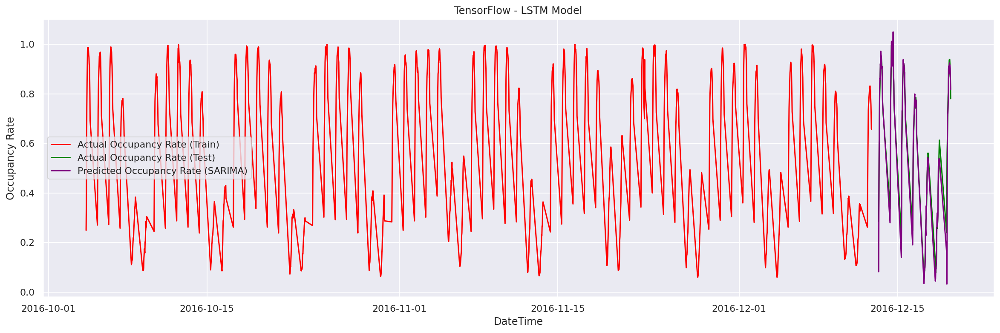

Explained Variance:
	 0.9527464875757218
MAE:
	 0.03382627345535429
RMSE:
	 0.060848855606478756


In [ ]:
plt.figure(figsize=(20,6))
plt.title('TensorFlow - LSTM Model')
plt.plot(train, color='red', label='Actual Occupancy Rate (Train)')
plt.xlabel('DateTime')
plt.ylabel('Occupancy Rate')
plt.plot(df_lstm_final['OccupancyRate'], color='green', label='Actual Occupancy Rate (Test)')
plt.plot(df_lstm_final['Prediction'], color='purple', label='Predicted Occupancy Rate (SARIMA)')
plt.legend()

plt.show()

report_metrics(df_lstm_final['OccupancyRate'].squeeze(), df_lstm_final['Prediction'].squeeze())

The graph indicated that the accuracy of this model is nearly 95.27%, the Mean Absolute Error is 0.0338, and finally the Root Mean Squared Error is 0.06. Based on the evaluation above, we can see that the model made and trained by TensorFlow and LSTM, is better compared to the model trained by Seasonal ARIMA.

### Model Comparison

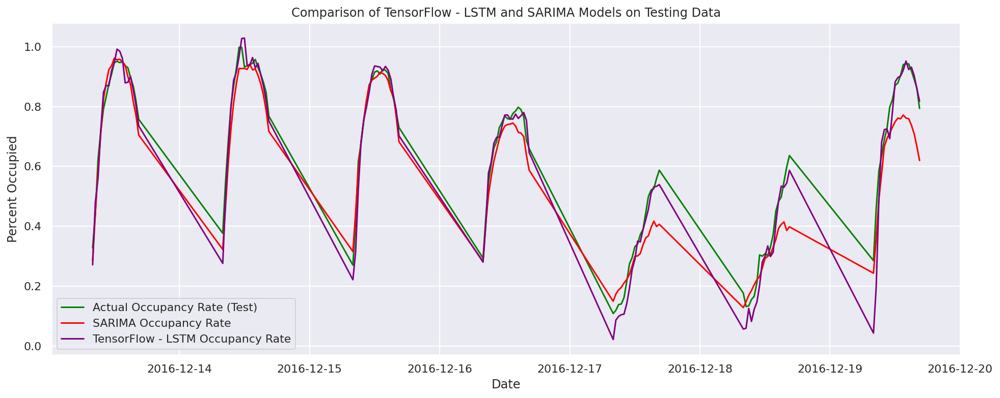

In [ ]:
plt.figure(figsize=(16,6))
plt.title('Comparison of TensorFlow - LSTM and SARIMA Models on Testing Data')
plt.xlabel('Date')
plt.ylabel('Percent Occupied')
plt.plot(test, color='green', label='Actual Occupancy Rate (Test)')
plt.plot(y_pred_sar, color='red', label='SARIMA Occupancy Rate')

plt.plot(df_lstm_final['Prediction'], color='purple', label='TensorFlow - LSTM Occupancy Rate')

plt.legend()

plt.show()

# Correlation and Train Model (Carpark 2 - Broad Street)

## Build And Train Model (Part 1)

For this Carpark 2 Broad Street, we will do the same things that we have done with the Carpark 1 to train the model and evaluate the prediction.
Now I will clean and prepare in deep to make those being able to use for the model.


In [ ]:
carpark2_parking_data_clean = parking_data_clean[parking_data_clean['SystemCodeNumber'].str.match('Broad Street')]

In [ ]:
data_drop = carpark2_parking_data_clean.groupby('datetime_halfhour').agg({'Occupancy':['sum','count'], 'Capacity':['sum','count']})
data_drop['OccupancyRate'] = data_drop.Occupancy['sum'] / data_drop.Capacity['sum']

I will separate the dataset of the “Broad Street” to a specific variable. And I will make the sum and count column of Occupancy and Capacity to check whether or not this dataset contains the fault values that the count of both Occupancy or Capacity is higher than 1, and the sum of Capacity is below 690. If this “Broad Street” dataset contains any of the data that satisfying the conditions above, we need to clean this dataset again to remove those data.

In [ ]:
data_drop_check = data_drop[((data_drop.Occupancy['count']>1)|(data_drop.Capacity['count']>1))&(data_drop.Capacity['sum']<=690)]

In [ ]:
data_drop_check

Empty DataFrame
Columns: [(Occupancy, sum), (Occupancy, count), (Capacity, sum), (Capacity, count), (OccupancyRate, )]
Index: []

We need to make sure each day would have 18 timesteps (from 8:00 to 16:30), so that we will run some code to check the datetime_halfhour column to find out which days and periods time weren’t included.

In [ ]:
data_drop.drop(columns=['Occupancy', 'Capacity'], inplace=True)

In [ ]:
temporary_df = data_drop.reset_index()
temporary_df['date'] = temporary_df.datetime_halfhour.dt.date
temporary_df['time'] = temporary_df.datetime_halfhour.dt.time
temporary_df = temporary_df.groupby('date').count()
temporary_df = pd.DataFrame(temporary_df, index=pd.date_range('2016-10-04', '2016-12-19')).fillna(0)
temporary_df[(temporary_df.datetime_halfhour == 0)|(temporary_df.datetime_halfhour < 18)]

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,datetime_halfhour,OccupancyRate,time
,,,
2016-10-20,0.0,0.0,0.0
2016-10-21,0.0,0.0,0.0
2016-10-28,17.0,17.0,17.0
2016-10-30,16.0,16.0,16.0
2016-11-03,17.0,17.0,17.0
2016-11-18,17.0,17.0,17.0
2016-11-25,17.0,17.0,17.0
2016-12-03,0.0,0.0,0.0
2016-12-04,0.0,0.0,0.0


As we can see from the picture above that we have 12 days weren’t contained enough 18 timesteps. Based on the knowledge of seasonal and trend that people would tend to do things on a weekly basis. So that I will create some code to fill in the missing time with the occupancy at the same time at the one week earlier.

In [ ]:
def fillmissing_based_week_prior(parameter, data_fill, year, month, day, hour, minutes):
  data_fill.loc[pd.to_datetime(datetime.datetime(year, month, day, hour, minutes)), parameter] = \
      data_fill.loc[pd.to_datetime(datetime.datetime(year, month, day, hour, minutes) + timedelta(days=-7)), parameter].values[0]

data_fillmissing = data_drop.copy()

for hour in range(8, 17):
  for hourhalf in [0, 30]:
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 4, hour, hourhalf)
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 3, hour, hourhalf)
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 21, hour, hourhalf)
    fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 20, hour, hourhalf)

fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 28, 8, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 30, 16, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 10, 30, 16, 30)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 11, 18, 9, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 11, 25, 8, 30)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 13, 13, 30)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 12, 14, 11, 0)
fillmissing_based_week_prior('OccupancyRate', data_fillmissing, 2016, 11, 3, 16, 0)


data_fillmissing.sort_index(inplace=True)

We will check again and see whether or not those missing data are filled. The picture below indicates nothing contained in the table, which means that those missing data are filled.

In [ ]:
temporary_df_x = data_fillmissing.reset_index()
temporary_df_x['date'] = temporary_df_x.datetime_halfhour.dt.date
temporary_df_x['time'] = temporary_df_x.datetime_halfhour.dt.time
temporary_df_x = temporary_df_x.groupby('date').count()
temporary_df_x = pd.DataFrame(temporary_df_x, index=pd.date_range('2016-10-04', '2016-12-19')).fillna(0)
temporary_df_x[(temporary_df_x.datetime_halfhour == 0)|(temporary_df_x.datetime_halfhour < 18)]

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:3889: PerformanceWarning: dropping on a non-lexsorted multi-index without a level parameter may impact performance.
  obj = obj._drop_axis(labels, axis, level=level, errors=errors)


,datetime_halfhour,OccupancyRate,time
,,,


I will plot the data again together with data that will be shifted 18 timesteps (to the yesterday), the goal of this plot is that we can check and make sure that it doesn’t contain any more gaps in the data. Picture below indicated that it doesn’t contain any more gaps in the data, now we can move to the next part – split train and test and train the model.

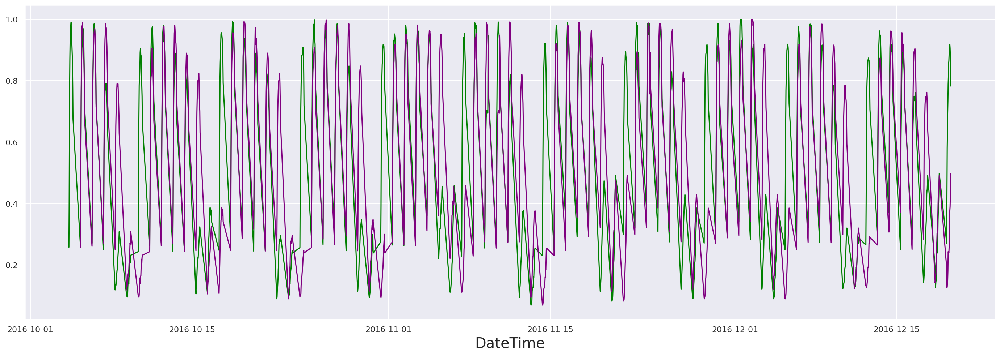

In [ ]:
plt.figure(figsize=(24,8))
plt.plot(data_fillmissing, color='green')
plt.plot(data_fillmissing.shift(18), color='purple')
plt.xlabel('DateTime', fontsize=20);

## Correlation (AutoCorrelation - Partial AutoCorrelation)

I will use Auto-Correlation and Partial Auto-Correlation with the goal that pointing out whether or not the data is seasonal properties based on the time it is collected.

### AutoCorrelation

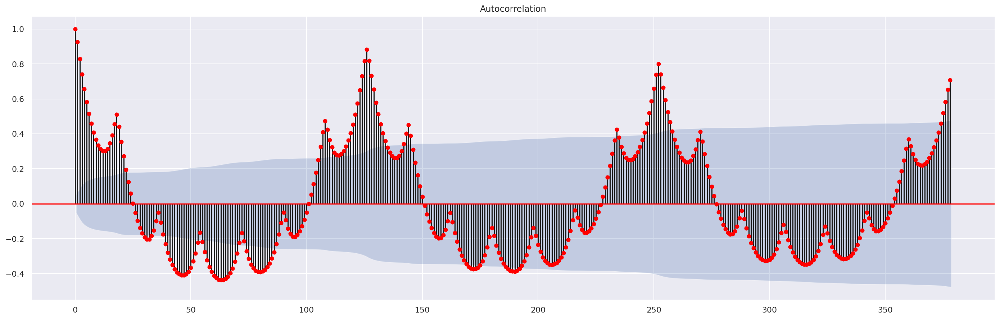

In [ ]:
def subplots_acf(series):
    fig1 = plt.figure(figsize=(24,16))
    ax1 = fig1.add_subplot(211)
    fig1 = plot_acf(series, lags=378, ax=ax1, color='red')
    plt.show()

subplots_acf(data_fillmissing)

###  Partial AutoCorrelation

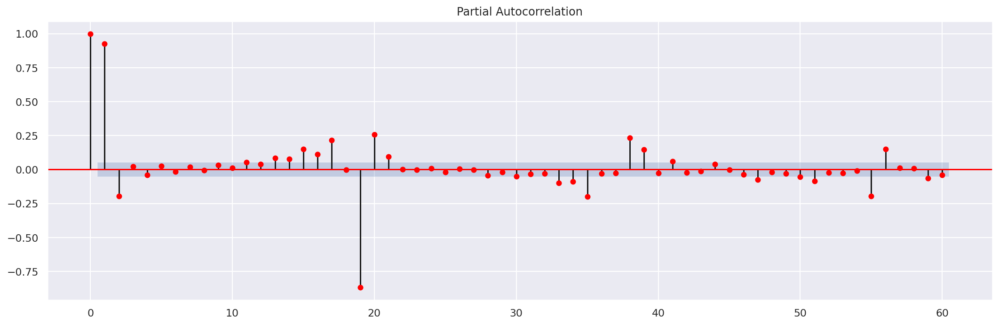

In [ ]:
def subplots_pacf(series):
    fig2 = plt.figure(figsize=(18,12))    
    ax2 = fig2.add_subplot(212)
    fig2 = plot_pacf(series, lags=60, ax=ax2, color='red')
    plt.show()

subplots_pacf(data_fillmissing)

From 2 figures from each of the carpark above that indicating the graphs of Auto-Correlation and Partial Auto-Correlation, we can clearly see the data contained both negative and positive correlation and its different between time. Because of that, the dataset of “Broad Street” are seasonal, and those reinforce the thesis of data discovery in the Part 1 that trend of the occupancy is higher on weekday compared to weekend and it changed during day time and between weekend and weekday.

##Build And Train Model (Part 2)

### Split data to train and Test

We will use the TimeSeriesSplit function of sklearn to split of data with the n_splits = 10, which means that we will use the first 10 weeks to train the model and test with the last week.

In [ ]:
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=10)
print(tscv)

data_use = data_fillmissing.reset_index()['OccupancyRate']

for train_index, test_index in tscv.split(data_use):
  train = data_use[train_index]
  test = data_use[test_index]

TimeSeriesSplit(max_train_size=None, n_splits=10)


In [ ]:
print(train.describe())
print(test.describe())

count    1260.000000
mean        0.624997
std         0.300889
min         0.069565
25%         0.310870
50%         0.742029
75%         0.888768
max         1.000000
Name: OccupancyRate, dtype: float64
count    126.000000
mean       0.631217
std        0.268666
min        0.126087
25%        0.390580
50%        0.733333
75%        0.876812
max        0.962319
Name: OccupancyRate, dtype: float64


In [ ]:
train.index = data_fillmissing.index[:len(train)]
train.tail()

datetime_halfhour
2016-12-12 14:30:00    0.866667
2016-12-12 15:00:00    0.846377
2016-12-12 15:30:00    0.813043
2016-12-12 16:00:00    0.772464
2016-12-12 16:30:00    0.705797
Name: OccupancyRate, dtype: float64

In [ ]:
test.index = data_fillmissing.index[len(train):]
test.head()

datetime_halfhour
2016-12-13 08:00:00    0.307246
2016-12-13 08:30:00    0.421739
2016-12-13 09:00:00    0.633333
2016-12-13 09:30:00    0.733333
2016-12-13 10:00:00    0.823188
Name: OccupancyRate, dtype: float64

### SARIMA Model

We will import the auto_arima from pdarima to check the best ARIMA order

In [ ]:
from pmdarima import auto_arima
stepwise_fit = auto_arima(data_fillmissing['OccupancyRate'],
                          max_order = 4, stepwise = True, trace = True, suppress_warnings = True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=-2178.029, Time=1.79 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=580.524, Time=0.16 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=-2126.154, Time=0.08 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=-771.456, Time=0.34 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2918.246, Time=0.06 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=-2178.423, Time=1.00 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=-1385.660, Time=0.82 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=-2180.400, Time=0.57 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=-2178.443, Time=1.21 sec
 ARIMA(2,0,0)(0,0,0)[0] intercept   : AIC=-2179.450, Time=0.20 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=-2123.065, Time=0.25 sec

Best model:  ARIMA(1,0,1)(0,0,0)[0] intercept
Total fit time: 6.492 seconds


In [ ]:
stepwise_fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                 1386
Model:               SARIMAX(1, 0, 1)   Log Likelihood                1094.200
Date:                Sat, 17 Apr 2021   AIC                          -2180.400
Time:                        21:46:55   BIC                          -2159.463
Sample:                             0   HQIC                         -2172.569
                               - 1386                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0643      0.015      4.158      0.000       0.034       0.095
ar.L1          0.8970      0.028     32.019      0.000       0.842       0.952
ma.L1          0.2180      0.024      8.954      0.000       0.170       0.266
sigma2         0.0121      0.000     30.776      0.000       0.011       0.013
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              6618.46
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.88   Skew:                            -2.56
Prob(H) (two-sided):                  0.15   Kurtosis:                        12.41
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

Best Order for dataset “Broad Street” is (1,0,1), so that I will input this order to the SARIMA model.

In [ ]:
%%time
# Define and fit SARIMA model
my_seasonal_order = (9, 0, 3, 18)
sarima_model = SARIMAX(train, order=(1, 0, 1), seasonal_order=my_seasonal_order)
results_SAR = sarima_model.fit(disp=-1)

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:583: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  ' ignored when e.g. forecasting.', ValueWarning)
/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)


CPU times: user 11min 28s, sys: 5min 2s, total: 16min 30s
Wall time: 8min 22s


After running 8min 22s, I successfully got the prediction and I will test the prediction with the test data of the last week. Before visualize and evaluate the model, I would create a function which acts as a metrics to evaluate our prediction.

In [ ]:
def report_metrics(y_true, y_pred):
    print("Explained Variance:\n\t", metrics.explained_variance_score(y_true, y_pred))
    print("MAE:\n\t", metrics.mean_absolute_error(y_true, y_pred))
    print("RMSE:\n\t", np.sqrt(metrics.mean_squared_error(y_true, y_pred)))

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:379: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  ValueWarning)


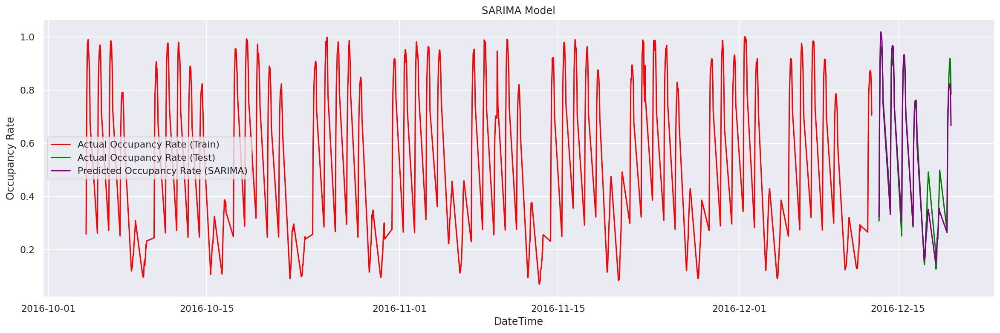

Explained Variance:
	 0.9598448659047226
MAE:
	 0.04264887259163371
RMSE:
	 0.05436571025207462


In [ ]:
plt.figure(figsize=(20,6))
plt.title('SARIMA Model')
plt.plot(train, color='red', label='Actual Occupancy Rate (Train)')
plt.xlabel('DateTime')
plt.ylabel('Occupancy Rate')
y_pred_sar = pd.Series(results_SAR.forecast(steps=len(test)).values, index=test.index)
plt.plot(test, color='green', label='Actual Occupancy Rate (Test)')
plt.plot(y_pred_sar, color='purple', label='Predicted Occupancy Rate (SARIMA)')
plt.legend()

plt.show()

report_metrics(test.squeeze(), y_pred_sar.squeeze())

The Output so that our model predicted with the accuracy 95.98% compared to the real data test file. With the number of mean absolute error was about 0.042 and mean squared error was about 0.054, which evaluated that this model is quite good.

###TensorFlow - LSTM Model

I create an accordant train and test to train the TensorFlow LSTM model.

In [ ]:
scaler = MinMaxScaler()
scaler_data = scaler.fit_transform(data_fillmissing)
scaler_data = scaler_data[:,0]
time = np.arange(0, 1386, 1)

In [ ]:
scaler_df = pd.DataFrame(dict(OccupancyRate=scaler_data), index=time, columns=['OccupancyRate'])
train_size = int(len(scaler_df) * 0.8965)
test_size = len(scaler_df) - train_size
train2, test2 = scaler_df.iloc[0:train_size], scaler_df.iloc[train_size:len(scaler_df)]
print(len(train2), len(test2))

1242 144


In [ ]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps)].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps])
    return np.array(Xs), np.array(ys)

time_steps = 18
X_train, y_train = create_dataset(train2, train2.OccupancyRate, time_steps)
X_test, y_test = create_dataset(test2, test2.OccupancyRate, time_steps)
print(X_train.shape, y_train.shape)

(1224, 18, 1) (1224,)


I prepare the LSTM model with the Keras and Mean Squared Error, and specify additional value.

In [ ]:
lstm_model = keras.Sequential()
lstm_model.add(keras.layers.LSTM(
  units=128,
  input_shape=(X_train.shape[1], X_train.shape[2])
))
lstm_model.add(keras.layers.Dense(units=1))
lstm_model.compile(
  loss='mean_squared_error',
  optimizer=keras.optimizers.Adam(0.001)
)

Now I will run the train function and specify the eporch 1032 times with the value of validation split is 0.1

In [ ]:
history = lstm_model.fit(
    X_train, y_train,
    epochs=1032,
    batch_size=16,
    validation_split=0.1,
    verbose=1,
    shuffle=False
)

Epoch 1/1032
69/69 [==============================] - 4s 10ms/step - loss: 0.1396 - val_loss: 0.0434
Epoch 2/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0464 - val_loss: 0.0340
Epoch 3/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0361 - val_loss: 0.0230
Epoch 4/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0264 - val_loss: 0.0180
Epoch 5/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0215 - val_loss: 0.0244
Epoch 6/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0236 - val_loss: 0.0160
Epoch 7/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0177 - val_loss: 0.0125
Epoch 8/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0148 - val_loss: 0.0112
Epoch 9/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0158 - val_loss: 0.0131
Epoch 10/1032
69/69 [==============================] - 0s 4ms/step - loss: 0.0148 - val_loss: 0.009

I will prepare the prediction data which has been generated by the LSTM model, to visualize and evaluate the accuracy, MAE and RMSE.

In [ ]:
lstm_pred = lstm_model.predict(X_test)
df_lstm_final = test2[lstm_pred.shape[0]*-1:].copy()
df_lstm_final['Prediction'] = lstm_pred[:,0]
df_reset_index = data_fillmissing.reset_index()
df_lstm_final['Date'] = df_reset_index['datetime_halfhour']
df_lstm_final = df_lstm_final.set_index(["Date"], drop=True)

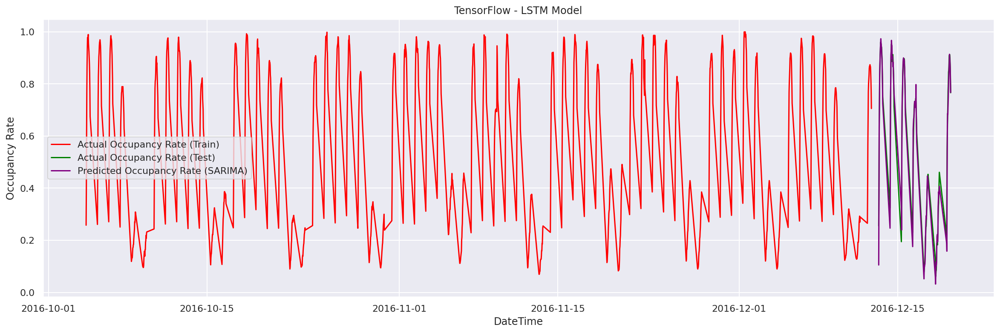

Explained Variance:
	 0.9787444224376523
MAE:
	 0.027456291223561306
RMSE:
	 0.042286275998755764


In [ ]:
plt.figure(figsize=(20,6))
plt.title('TensorFlow - LSTM Model')
plt.plot(train, color='red', label='Actual Occupancy Rate (Train)')
plt.xlabel('DateTime')
plt.ylabel('Occupancy Rate')
plt.plot(df_lstm_final['OccupancyRate'], color='green', label='Actual Occupancy Rate (Test)')
plt.plot(df_lstm_final['Prediction'], color='purple', label='Predicted Occupancy Rate (SARIMA)')
plt.legend()

plt.show()

report_metrics(df_lstm_final['OccupancyRate'].squeeze(), df_lstm_final['Prediction'].squeeze())

The graph indicated that the accuracy of this model is nearly 97.87%, the Mean Absolute Error is 0.0275, and finally the Root Mean Squared Error is 0.0423. Based on the evaluation above, we can see that the model made and trained by TensorFlow and LSTM, is better compared to the model trained by Seasonal ARIMA.

### Model Comparison

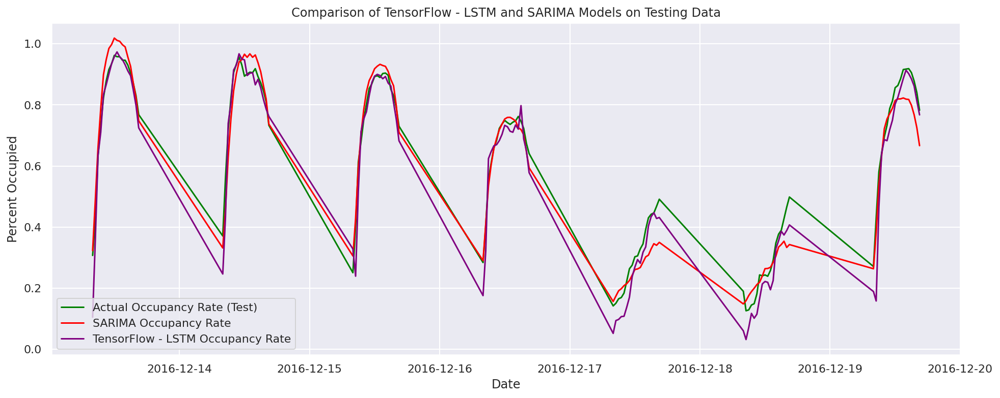

In [ ]:
plt.figure(figsize=(16,6))
plt.title('Comparison of TensorFlow - LSTM and SARIMA Models on Testing Data')
plt.xlabel('Date')
plt.ylabel('Percent Occupied')
plt.plot(test, color='green', label='Actual Occupancy Rate (Test)')
plt.plot(y_pred_sar, color='red', label='SARIMA Occupancy Rate')

plt.plot(df_lstm_final['Prediction'], color='purple', label='TensorFlow - LSTM Occupancy Rate')

plt.legend()

plt.show()

# 4.	Identifying the potential missing attribute in the data collection and justify

We believe that the population density inside the 30 parking sites is a missing feature that should be collected in order to enhance the business strategy further. This will help us to figure out where to expand in certain areas with higher population density. We'll do this using the K-Mean clustering process, which will help us greatly in visualizing the strategy a lot better. If the occupancy rate is not too high in less densely populated areas, we no longer worry about it , but in case that it’s very high, so we should consider shifting the masses to larger capacity parking lots through road shifts or signs. Currently, the strategy only forecasts potential occupancy rates, and will assist in expansion or reduction, although it would not cover a comprehensive strategy. The strategy can be much more well designed with simple and easy-to-follow methods when combined with data on population density around such parking areas.